<a href="https://colab.research.google.com/github/amitmldlai/Machine-Learning/blob/main/Image_Captioning.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
import warnings
warnings.filterwarnings("ignore")
import numpy as np
from numpy import array
import pandas as pd
from tqdm import tqdm
import datetime as datetime
import tensorflow as tf
import matplotlib.pyplot as plt
%matplotlib inline
import seaborn as sns
from wordcloud import WordCloud
import glob
import string
import cv2
import imgaug.augmenters as iaa
from pickle import dump, load
from keras.preprocessing import image
from keras.preprocessing.image import load_img, img_to_array
from keras.applications.vgg16 import VGG16, preprocess_input
from keras.layers import LSTM, Embedding, Dense, Activation, Dropout
from keras.callbacks import ModelCheckpoint, ModelCheckpoint, TensorBoard
from keras.layers.merge import Add
from keras.preprocessing import sequence
from keras.models import Model
from keras import Input, layers
from keras import optimizers
from keras.preprocessing.text import Tokenizer
from keras.preprocessing.sequence import pad_sequences
tf.random.set_seed(3)

**Count of Images in Dataset**

In [ ]:
image_path = '/content/Flicker8k_Dataset/'
dir_Flickr_text = '/content/Flickr_txt/Flickr8k.token.txt'
images_lst = glob.glob(image_path + '*.jpg')
no_of_image = len(images_lst)
print(f'Total Images in Datset : {no_of_image}')

Total Images in Datset : 8091


**Utility Fuctions:**

*   **Load text**
*   **Preparing Text data from Flickr8k.txt file**
*   **Prepare DataFrames** 


In [ ]:
def load_txt(txt_file):
  with open(txt_file,'r') as file:
    text = file.read()
  return text

def prepare_clean_txt(text):
  text_data = []
  table = str.maketrans('', '', string.punctuation)  
  for line in tqdm(text.split('\n')):               # spiltting over each line
    col = line.split('\t')                          # splitting over each space in each line
    if len(col) == 1:                               # neglecting data if full information not present
        continue
    filename, index = col[0].split("#")  
    filename_path = image_path + filename                   # splitting to gather information about image index number and imageid 
    txt = col[1].split() 
    txt = [word.lower() for word in txt]            # convert each word to lower case
    txt = [w.translate(table) for w in txt]         # to remove punctuations from sentence
    txt = [word for word in txt if len(word)>1]     # to discard words of length 1
    txt = [word for word in txt if word.isalpha()]  # to discard numeric string
    txt = ' '.join(txt)  
    text_data.append([index]+ [filename_path] + [txt])
  return text_data                                  # [index, filename, caption text]


def prepare_dataframes(text_data):
  data_df = pd.DataFrame(text_data, columns=[ 'index', 'filename', 'caption'])
  data_df = data_df[data_df.filename != '2258277193_586949ec62.jpg.1']                              # removing data with improper imageid
  data_df['caption_with_tags'] = data_df['caption'].apply(lambda txt : 'startseq ' + txt + ' endseq')       
  tokenizer = Tokenizer()
  tokenizer.fit_on_texts(data_df.caption.values)
  data_df['caption_word_count'] = data_df['caption'].apply(lambda caption: len(caption.split()))
  word = []
  frequency = []
  for k,v in tokenizer.word_counts.items():
    word.append(k)
    frequency.append(v)
  df_word_count = pd.DataFrame({'word': word, 'frequency': frequency})  
  df_word_count.sort_values('frequency', ascending=False, inplace=True, ignore_index=True)
  return data_df, df_word_count  

In [ ]:
text = load_txt(dir_Flickr_text)
text_data = prepare_clean_txt(text)
data_df, df_word_count = prepare_dataframes(text_data)

100%|██████████| 40461/40461 [00:00<00:00, 57962.22it/s]


In [ ]:
data_df.head(3)

,index,filename,caption,caption_with_tags,caption_word_count
0,0,/content/Flicker8k_Dataset/1000268201_693b08cb...,child in pink dress is climbing up set of stai...,startseq child in pink dress is climbing up se...,14
1,1,/content/Flicker8k_Dataset/1000268201_693b08cb...,girl going into wooden building,startseq girl going into wooden building endseq,5
2,2,/content/Flicker8k_Dataset/1000268201_693b08cb...,little girl climbing into wooden playhouse,startseq little girl climbing into wooden play...,6


# **Exploratory Data Analysis**

In [ ]:
from collections import Counter
def utility_counter(data):
  filename = data_df.filename.values
  caption_count = Counter(filename).values()
  uni_filenames = np.unique(filename)
  print(f'Number of unique file names : {len(uni_filenames)}')
  print(f'Number of captions per image : {set(caption_count)}')
  print(f'All image have same number of captions: {all(caption_count)}')
  
utility_counter(data_df)

Number of unique file names : 8092
Number of captions per image : {5}
All image have same number of captions: True


*Image - Caption visualization*

100%|██████████| 3/3 [00:00<00:00, 20.28it/s]


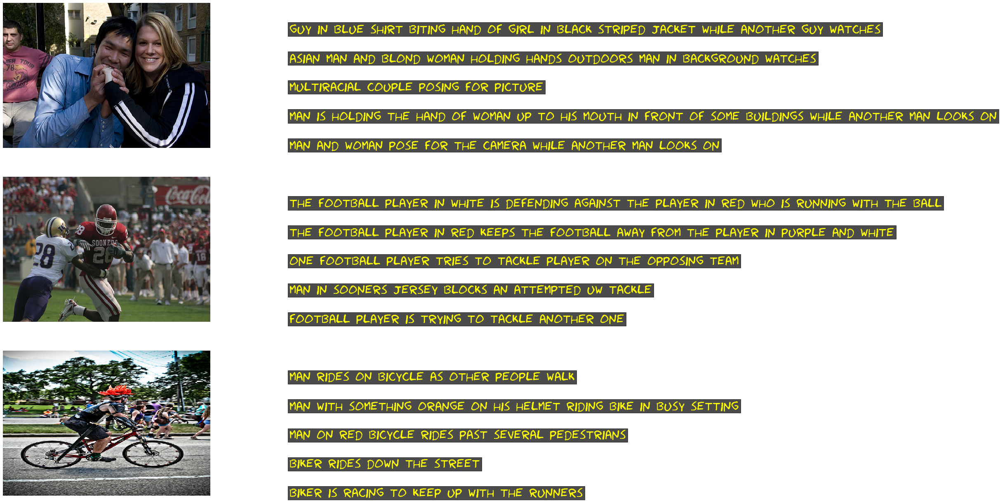

In [ ]:
import random
def image_caption_plotter(data):
  npic = 3
  target_size = (350, 500, 3)
  count = 1
  fig = plt.figure(figsize=(25, 22))
  for file in tqdm(random.sample(list(data['filename']), npic)):
    captions = list(data['caption'].loc[data['filename'] == file].values)
    image_load = load_img(file, target_size = target_size)
    ax = fig.add_subplot(npic, 2, count)
    ax.axis('off')
    ax.imshow(image_load, interpolation='nearest')
    count += 1
    ax = fig.add_subplot(npic, 2, count)
    ax.axis('off')
    ax.set_ylim(0, len(captions))
    for i, caption in enumerate(captions):
      ax.text(0, i, caption, fontsize = 30, fontfamily= 'fantasy', bbox=dict(facecolor='black', alpha=0.7), color='yellow')
    count += 1
    plt.grid(None)  
  plt.show()
 

image_caption_plotter(data_df)

Observation


*   We can see each image has 5 captions associated with it.



*Plot for word - frequency*

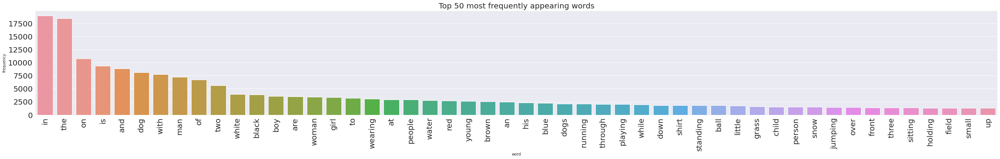

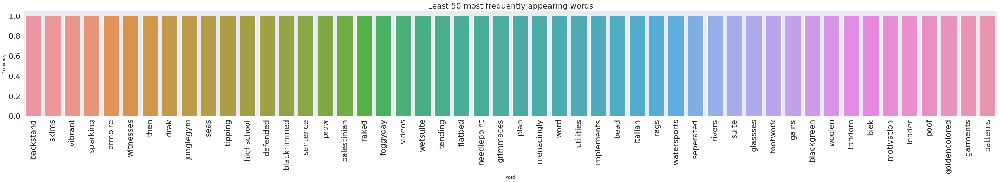

In [ ]:
count = 50

def plot_word_count(df, title = ''):
    sns.set_style('darkgrid')
    plt.figure(figsize = (45, 5))
    sns.barplot(x=df['word'], y=df["frequency"])
    plt.yticks(fontsize = 20)
    plt.xticks( rotation = 'vertical', fontsize = 20)
    plt.title(title, fontsize = 20)
    plt.show()

plot_word_count(df_word_count.iloc[:count, :], title= 'Top 50 most frequently appearing words')
plot_word_count(df_word_count.iloc[-count:, :], title= 'Least 50 most frequently appearing words')

*Word Cloud Visualization*

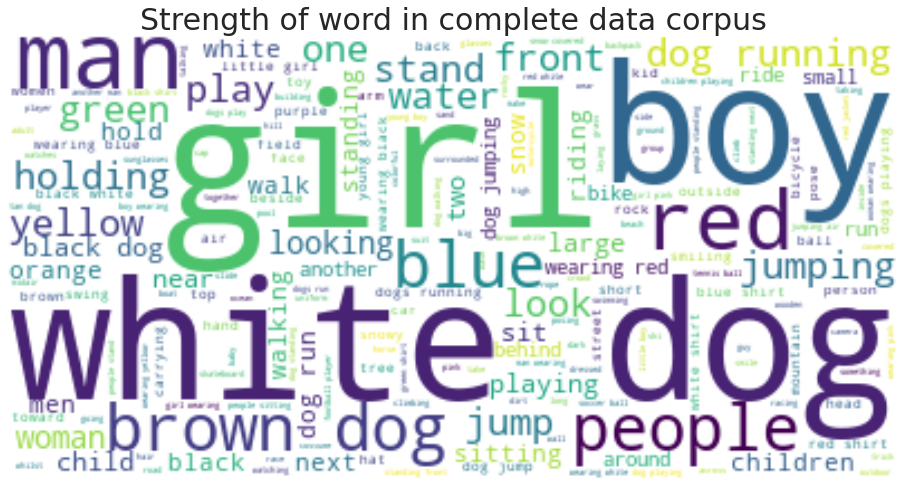

In [ ]:
text = ' '
for caption in data_df.caption:
  text = text + caption
plt.figure(figsize=(16, 12))
word_cloud = WordCloud(collocations= True, background_color = 'white').generate(text)
plt.imshow(word_cloud, interpolation='bilinear')
plt.axis("off")
plt.title('Strength of word in complete data corpus', fontsize = 30)
plt.show()

*Distribution of number of words in each caption*

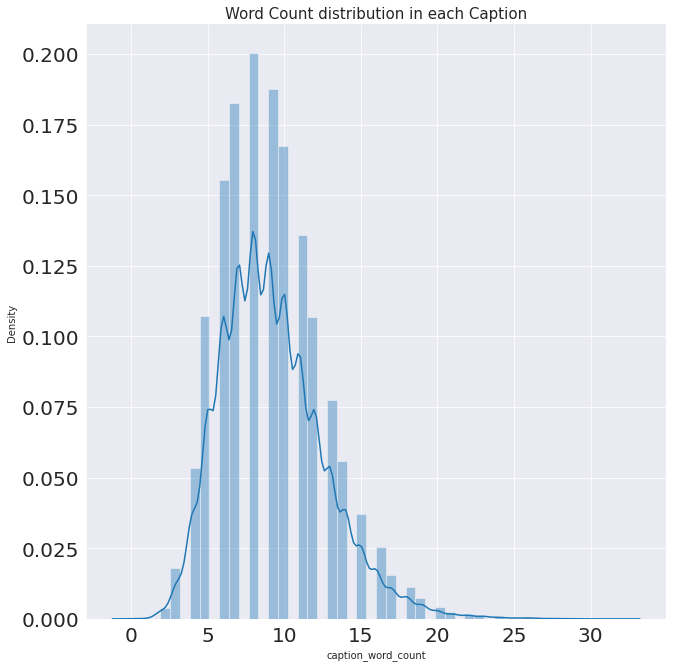

In [ ]:
sns.set_style('darkgrid')
sns.FacetGrid(data_df, height = 9).map(sns.distplot, 'caption_word_count').add_legend()
plt.yticks(fontsize = 20)
plt.xticks(fontsize = 20)
plt.title('Word Count distribution in each Caption', fontsize = 15)
plt.show()

Observation:


*   We can see most of captions contain words in range of 7 to 10





*   **Train_filename_container : Train image path**
*   Test_filename_container : Test image path 




In [ ]:
train_images_file = '/content/Flickr_txt/Flickr_8k.trainImages.txt'
train_images = set(open(train_images_file, 'r').read().strip().split('\n'))
train_filename_container = [image_path+filename for filename in train_images if image_path+filename in images_lst]

test_images_file = '/content/Flickr_txt/Flickr_8k.testImages.txt'
test_images = set(open(test_images_file, 'r').read().strip().split('\n'))
test_filename_container = [image_path+filename for filename in test_images if image_path+filename in images_lst]

**Augumentation on images**

In [ ]:
def augument_image(image_path, aug=True, visualize=False):
  if visualize:
    image = cv2.imread(image_path, cv2.IMREAD_UNCHANGED)
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    image = cv2.resize(image, (224, 224))
  else:  
    image = load_img(image_path, target_size=(224, 224))
    image = img_to_array(image)
  if aug:
    aug2 = iaa.Fliplr(1) 
    aug3 = iaa.Flipud(1)
    aug4 = iaa.Emboss(alpha=(1), strength=1)
    aug5 = iaa.DirectedEdgeDetect(alpha=(0.8), direction=(1.0))
    aug6 = iaa.Sharpen(alpha=(1.0), lightness=(1.5))

    a = np.random.uniform()
    if a<0.2:
      aug_image = aug2.augment_image(image)
    elif a<0.4:
      aug_image = aug3.augment_image(image)
    elif a<0.6:
      aug_image = aug4.augment_image(image)
    elif a<0.8:
      aug_image = aug5.augment_image(image)
    else:
      aug_image = aug6.augment_image(image) 
    return image, aug_image
  else:
    return image
  

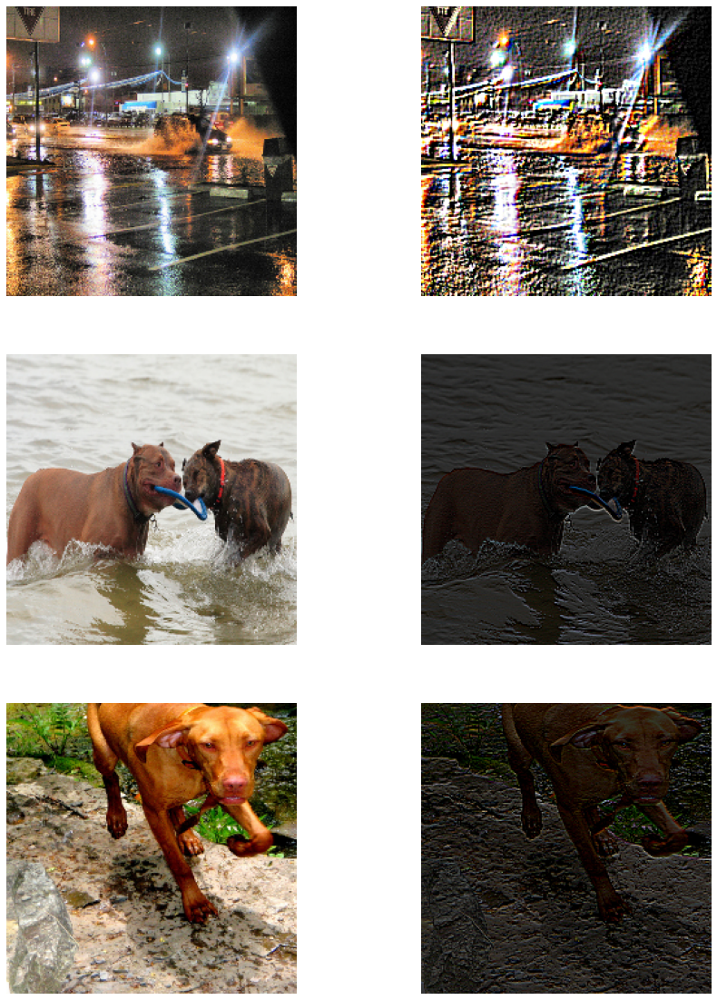

In [ ]:
row = 3
col = 2
dataset = [augument_image(train_filename_container[np.random.randint(0, 5000)], aug=True, visualize=True) for _ in range(0, 3)]
fig = plt.figure(figsize=(15, 20))
for counter in range(0, row*col):
  fig.add_subplot(row, col, counter+1)
  plt.imshow((dataset[int(counter/2)][counter%2]))
  plt.axis('off')
  plt.grid(None)



*   train_caption_mapping: Train image caption 
*   test_caption_mapping: Train image caption 



In [ ]:
train_caption_mapping = {}
for file in tqdm(train_filename_container):
    train_caption_mapping[file]= list(data_df.loc[data_df['filename'] == file].caption_with_tags)

test_caption_mapping = {}
for file in tqdm(test_filename_container):
    test_caption_mapping[file]= list(data_df.loc[data_df['filename'] == file].caption_with_tags)    

100%|██████████| 1000/1000 [00:02<00:00, 341.32it/s]


**Model load VGG16**

In [ ]:
model_vgg16 = VGG16(weights='imagenet', include_top=True)
model_new = Model(model_vgg16.input, model_vgg16.layers[-2].output)

553476096/553467096 [==============================] - 5s 0us/step


In [ ]:
def encode_image(filename_container, aug=True):
  encoding = {}
  augmented_image_path = []
  for image_path in tqdm(filename_container):
    image = augument_image(image_path, aug=aug)
    if aug:
      image = preprocess_input(image[0])
      aug_image = preprocess_input(image[1])

      features = model_new(np.expand_dims(image, axis=0))
      features = np.reshape(features, (features.shape[1],))
      features_aug = model_new(np.expand_dims(image, axis=0))
      features_aug = np.reshape(features_aug, (features_aug.shape[1],))

      encoding[image_path] = features
      aug_path = image_path[:-4]+'_aug.jpg'
      augmented_image_path.append(aug_path)
      train_caption_mapping[aug_path] = train_caption_mapping[image_path]
      encoding[aug_path] = features_aug
    else:
      image = preprocess_input(image)
      features = model_new(np.expand_dims(image, axis=0))
      fearures = np.reshape(features, (features.shape[1],))
      encoding[image_path] = features
  global train_filename_container
  train_filename_container += augmented_image_path
  return encoding

**Save the bottleneck train and test features to disk**

In [ ]:
encoding_train = encode_image(train_filename_container)
with open('/content/encoded_train_image_features.pkl', 'wb') as p:
    dump(encoding_train, p)

100%|██████████| 6000/6000 [08:49<00:00, 11.34it/s]


In [ ]:
encoding_test = encode_image(test_filename_container, aug=False)
with open('/content/encoded_test_image_feature.pkl', 'wb') as p:
    dump(encoding_test, p)

100%|██████████| 1000/1000 [00:44<00:00, 22.54it/s]


**Loading saved features**

In [ ]:
train_features = load(open("/content/encoded_train_image_features.pkl", "rb"))
print('Number of train image features', len(train_features))

test_features = load(open("/content/encoded_test_image_feature.pkl", "rb"))
print('Number of test image features', len(test_features))

Number of train image features 12000
Number of test image features 1000


**List of all the train, test captions**

In [ ]:
all_train_captions = set()
for _, caption_lst in tqdm(train_caption_mapping.items()):
    for caption in caption_lst:
        all_train_captions.add(caption)

all_test_captions = set()
for _, caption_lst in tqdm(test_caption_mapping.items()):
    for caption in caption_lst:
        all_test_captions.add(caption)        

100%|██████████| 1000/1000 [00:00<00:00, 266220.50it/s]


**Frequency of words in train, test caption**

In [ ]:
train_tokenizer = Tokenizer(oov_token = '<UNK>')
train_tokenizer.fit_on_texts(all_train_captions)
words = []
frequency = []
for word,freq in tqdm(train_tokenizer.word_counts.items()):
  words.append(word)
  frequency.append(freq)
df_wc_train = pd.DataFrame({'word': words, 'frequency': frequency}) 
df_wc_train.sort_values('frequency', ascending=False, inplace=True, ignore_index=True)

100%|██████████| 7578/7578 [00:00<00:00, 1340945.69it/s]


**Word-Index/Index-Word Mapping**

In [ ]:
ixtoword = dict((index, word) for word, index in train_tokenizer.word_index.items())
wordtoix = train_tokenizer.word_index
max_length = max(map(lambda caption: len(caption.split()), all_train_captions))
vocab_size = len(wordtoix)+1                                     

**Dataset Preparation/Dataloader**

In [ ]:
def dataset_loader(tokenizer, image_caption_mapping, image_features, max_length, images_per_batch, vocab_size):
    image_feature, input_seq, output_seq = list(), list(), list()
    image_count=0   
    while 1:                                                                                              # loop for ever over images
        for image_path, captions in image_caption_mapping.items():
            image_count+=1
            feature = image_features[image_path]
            sequences = tokenizer.texts_to_sequences(captions)
            for seq in sequences:
              for i in range(1, len(seq)):
                  in_seq, out_seq = seq[:i], seq[i]                                                       # split into input and output pair
                  in_seq = pad_sequences([in_seq], maxlen=max_length)[0]                                  # pad input sequence
                  out_seq = tf.keras.utils.to_categorical([out_seq], num_classes=vocab_size)[0]           # encode output sequence
                  image_feature.append(feature)
                  input_seq.append(in_seq)
                  output_seq.append(out_seq)
            if image_count==images_per_batch:                                                             # yield the batch data
                yield [[array(image_feature), array(input_seq)], array(output_seq)]
                image_feature, input_seq, output_seq = list(), list(), list()
                image_count=0

**Embeddings: Load Glove vectors**

In [ ]:
embeddings_index = {} 
f = open('/content/glove.6B.200d.txt', encoding="utf-8")

for line in tqdm(f):
    values = line.split()
    word = values[0]
    coefs = np.asarray(values[1:], dtype='float32')
    embeddings_index[word] = coefs
f.close()
print(f'\n Number of words in glove vector: {len(embeddings_index)}')

400000it [00:18, 21682.16it/s]


 Number of words in glove vector: 400000


**Embedding matrix**

In [ ]:
embedding_dim = 200
embedding_matrix = np.zeros((vocab_size, embedding_dim))
for word, i in wordtoix.items():
    embedding_vector = embeddings_index.get(word)
    if embedding_vector is not None:
        embedding_matrix[i] = embedding_vector
        
embedding_matrix.shape        

(7580, 200)

**Model Architecture**

In [ ]:
input_image = Input(shape=(4096, ), name='Image_Feature_input')
fe1 = Dropout(0.5, name='Dropout_image')(input_image)
fe2 = Dense(256, activation='relu', name='Activation_Encoder')(fe1)
input_text = Input(shape=(max_length,), name='Text_input')
se1 = Embedding(vocab_size, embedding_dim, mask_zero=True, weights=[embedding_matrix], trainable=False, name='Text_Feature')(input_text)
se2 = Dropout(0.5, name='Dropout_text')(se1)
se3 = LSTM(256, name='LSTM')(se2)
decoder1 = Add(name='Add')([fe2, se3])
decoder2 = Dense(256, activation='relu', name='Activation_Decoder')(decoder1)
output = Dense(vocab_size, activation='softmax',name='Output')(decoder2)
model = Model(inputs=[input_image, input_text], outputs=output)

**Model Summary**

In [ ]:
model.summary()

Model: "model_1"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 Text_input (InputLayer)        [(None, 34)]         0           []                               
                                                                                                  
 Image_Feature_input (InputLaye  [(None, 4096)]      0           []                               
 r)                                                                                               
                                                                                                  
 Text_Feature (Embedding)       (None, 34, 200)      1516000     ['Text_input[0][0]']             
                                                                                                  
 Dropout_image (Dropout)        (None, 4096)         0           ['Image_Feature_input[0][0]

**Model Architecture**

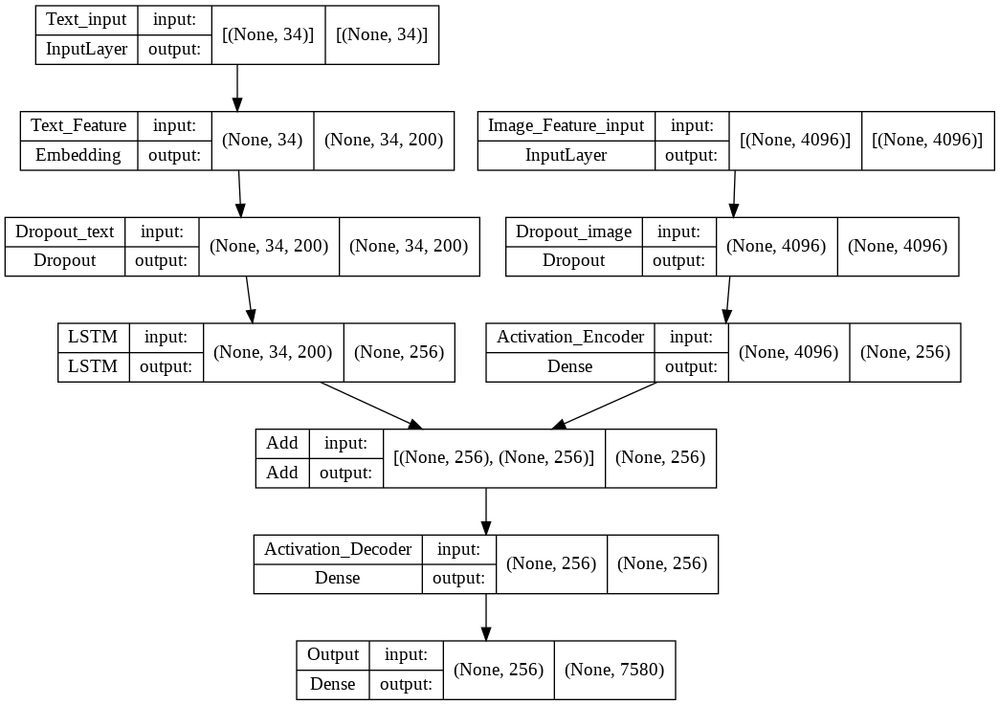

In [ ]:
tf.keras.utils.plot_model(model, to_file='model.png', show_shapes = True, show_layer_names = True, rankdir='TB')

**Compile/Callbacks**

In [ ]:
model.compile(loss='categorical_crossentropy', optimizer='adam', metrics=['accuracy'])
filepath = 'model-ep{epoch:03d}-loss{loss:.3f}.h5'
checkpoint = ModelCheckpoint(filepath, monitor='loss', verbose=1, save_best_only=True, mode='min')
log_dir = "logs/fit/"+ datetime.datetime.now().strftime("%Y%m%d-%H%M%S")
tensorboard = TensorBoard(log_dir = log_dir, histogram_freq=1)

**Model Fitting**

In [ ]:
images_per_batch = 16
steps = len(train_caption_mapping)//images_per_batch
learning_rate = 0.01

In [ ]:
# for i in range(epochs):
train_generator = dataset_loader(train_tokenizer, train_caption_mapping, train_features, max_length, images_per_batch, vocab_size)
history = model.fit(train_generator, epochs=60, steps_per_epoch=steps, verbose=1, callbacks = [checkpoint, tensorboard])

Epoch 1/60
750/750 [==============================] - ETA: 0s - loss: 1.8596 - accuracy: 0.4974
Epoch 1: loss did not improve from 1.66375
750/750 [==============================] - 210s 279ms/step - loss: 1.8596 - accuracy: 0.4974
Epoch 2/60
750/750 [==============================] - ETA: 0s - loss: 1.8544 - accuracy: 0.4983
Epoch 2: loss did not improve from 1.66375
750/750 [==============================] - 198s 264ms/step - loss: 1.8544 - accuracy: 0.4983
Epoch 3/60
750/750 [==============================] - ETA: 0s - loss: 1.8497 - accuracy: 0.4997
Epoch 3: loss did not improve from 1.66375
750/750 [==============================] - 198s 264ms/step - loss: 1.8497 - accuracy: 0.4997
Epoch 4/60
750/750 [==============================] - ETA: 0s - loss: 1.8447 - accuracy: 0.5000
Epoch 4: loss did not improve from 1.66375
750/750 [==============================] - 198s 265ms/step - loss: 1.8447 - accuracy: 0.5000
Epoch 5/60
750/750 [==============================] - ETA: 0s - loss: 1.

In [ ]:
model.save_weights('image_model10.hdf5')

**Loss/Accuracy Plot**

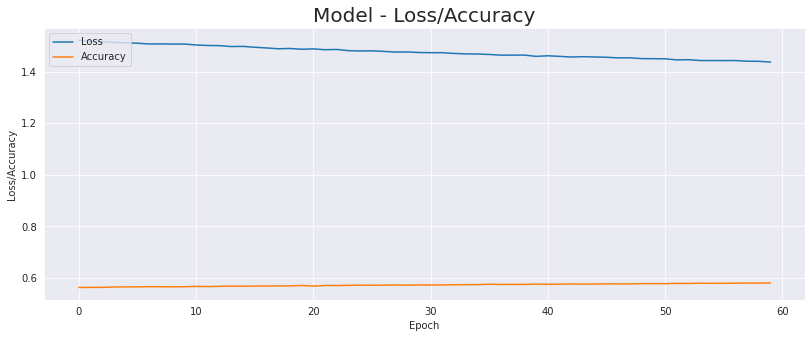

In [ ]:
plt.figure(figsize=(30, 5))
plt.subplot(121)
plt.plot(history.history['loss'])
plt.plot(history.history['accuracy'])
plt.title('Model - Loss/Accuracy', fontsize=20)
plt.ylabel('Loss/Accuracy')
plt.xlabel('Epoch')
plt.legend(['Loss', 'Accuracy'], loc='upper left')

**Tensorboard Plot**

In [ ]:
%load_ext tensorboard
%tensorboard --logdir logs/fit

The tensorboard extension is already loaded. To reload it, use:
  %reload_ext tensorboard


Reusing TensorBoard on port 6006 (pid 1483), started 1:36:32 ago. (Use '!kill 1483' to kill it.)

<IPython.core.display.Javascript object>

**Inference**

In [ ]:
with open("/content/encoded_test_image_feature.pkl", "rb") as encoded_pickle:
    encoding_test = load(encoded_pickle)

In [ ]:
def greedySearch(image):
    image = encoding_test[image]
    image = np.reshape(image, (1,4096))
    in_text = 'startseq'
    for i in range(max_length):
        sequence = [wordtoix[word] for word in in_text.split()]
        sequence = pad_sequences([sequence], maxlen=max_length)
        yhat = model.predict([image,sequence], verbose=0)
        yhat = np.argmax(yhat)
        word = ixtoword[yhat]
        in_text += ' ' + word
        if word == 'endseq':
            break
    final = in_text.split()
    final = final[1:-1]
    final = ' '.join(final)
    return final

In [ ]:
from nltk.translate.bleu_score import sentence_bleu
import random

def image_caption_score_extractor(data):
  npic = 6
  target_size = (224, 224, 3)
  count = 1
  fig = plt.figure(figsize=(60,65))
  for file in tqdm(random.sample(test_filename_container, npic)):
    predicted_caption = greedySearch(file)
    captions = list(data['caption'].loc[data['filename'] == file].values)
    image_load = load_img(file, target_size = target_size)
    ax = fig.add_subplot(npic, 2, count)
    ax.axis('off')
    ax.imshow(image_load, interpolation='nearest')
    reference = [caption.split() for caption in captions]
    candidate = predicted_caption.split()
    score = round(sentence_bleu(reference, candidate), 3)
    count += 1
    ax = fig.add_subplot(npic, 2, count)
    ax.axis('off')
    ax.set_ylim(0, len(captions)+2)
    for i, caption in enumerate(captions):
      ax.text(0, i, caption, fontsize = 40, bbox=dict(facecolor='black', alpha=0.7), color='pink') 
    ax.text(0, i+1, greedySearch(file),  fontsize =40, fontfamily= 'fantasy', bbox=dict(facecolor='black', alpha=0.7), color='yellow')  
    ax.text(0, i+2, 'BLEU Score: '+str(score),  fontsize = 40, fontfamily= 'fantasy', bbox=dict(facecolor='white', alpha=0.7), color='blue')
    count += 1 
  plt.grid(None)  
  plt.show()

image_caption_score_extractor(data_df)